# Genetic miner
 # Plan: Implement the Genetic Miner on the BPIC-17 log
- Experiment and start with 100 population and 100 Generations covering 80% of cases with only 610 variants

- import libraries:

In [25]:
import pm4py # process mining library
import pandas as pd # data manipulation library
import os # operating system library for file handling
import matplotlib.pyplot as plt # plotting library for visualizations
import numpy as np # numerical computing library for data analysis
import networkx as nx # library for graph analysis and visualization
import time # library for measuring execution time of code blocks

- load only completed and relabled events 

In [ ]:
df = pd.read_csv("../../data/complete_log.csv", low_memory=False)
df['time:timestamp'] = pd.to_datetime(df['time:timestamp'], format='mixed', utc=True)
event_log = pm4py.format_dataframe(df, case_id='case:concept:name', activity_key='concept:name', timestamp_key='time:timestamp')


- reduce data log for discovery:

In [27]:
discovery_log = pm4py.filter_variants_top_k(event_log, 610)
# equivalent: pm4py.filter_variants_top_k for a hard cap (e.g. top 50 variants)

- a first simple simplicity metrics is the size (arcs and nodes) that is implemented in the following way:

In [28]:
def calculate_node_size(net):
    """
    Calculates the total number of nodes in a pm4py Petri net.
    Nodes = Places + Transitions
    """
    num_places = len(net.places)
    num_transitions = len(net.transitions)
    
    return num_places + num_transitions

def calculate_arc_size(net):
    """
    Calculates the total number of arcs (edges) in a pm4py Petri net.
    """
    return len(net.arcs)

- another metric that makes sense in general is the cyclicity of the net
- implementation:

In [29]:
def calculate_cyclicity(net):
    """
    Calculates the cyclicity of a pm4py Petri net.
    Cyclicity = (number of nodes within cycles) / (total number of nodes)
    
    :param net: pm4py Petri net object
    :return: Float representing the cyclicity metric (between 0.0 and 1.0)
    """
    # 1. Calculate total number of nodes (Places + Transitions)
    total_nodes = len(net.places) + len(net.transitions)
    
    if total_nodes == 0:
        return 0.0
        
    # 2. Build a NetworkX Directed Graph
    G = nx.DiGraph()
    
    # Add all places and transitions as nodes
    for place in net.places:
        G.add_node(place)
    for transition in net.transitions:
        G.add_node(transition)
        
    # Add all arcs as directed edges
    for arc in net.arcs:
        G.add_edge(arc.source, arc.target)
        
    # 3. Identify nodes in cycles
    # A node is in a cycle if it is part of a Strongly Connected Component (SCC)
    # with more than 1 node, or if it is a single node with a self-loop.
    nodes_in_cycles = set()
    
    for scc in nx.strongly_connected_components(G):
        if len(scc) > 1:
            # All nodes in an SCC of size > 1 are part of a cycle
            nodes_in_cycles.update(scc)
        elif len(scc) == 1:
            # Check for self-loops for single-node components
            node = list(scc)[0]
            if G.has_edge(node, node):
                nodes_in_cycles.add(node)
                
    # 4. Calculate the cyclicity ratio
    cyclicity = len(nodes_in_cycles) / total_nodes
    
    return cyclicity

### process discovery 

- genetic miner:

└─Tournament 0:   0%|          | 0/200 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   0%|          | 1/200 [00:01<05:33,  1.68s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   1%|          | 2/200 [00:03<05:16,  1.60s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   2%|▏         | 3/200 [00:04<04:14,  1.29s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   2%|▏         | 4/200 [00:05<04:39,  1.43s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   2%|▎         | 5/200 [00:07<04:26,  1.36s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   3%|▎         | 6/200 [00:07<03:54,  1.21s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   4%|▎         | 7/200 [00:09<04:06,  1.28s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   4%|▍         | 8/200 [00:10<03:54,  1.22s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   4%|▍         | 9/200 [00:12<04:17,  1.35s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   5%|▌         | 10/200 [00:13<04:30,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   6%|▌         | 11/200 [00:14<04:04,  1.30s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   6%|▌         | 12/200 [00:16<04:08,  1.32s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   6%|▋         | 13/200 [00:17<03:56,  1.26s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   7%|▋         | 14/200 [00:18<03:47,  1.22s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   8%|▊         | 15/200 [00:19<03:47,  1.23s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   8%|▊         | 16/200 [00:21<04:08,  1.35s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   8%|▊         | 17/200 [00:22<03:50,  1.26s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:   9%|▉         | 18/200 [00:23<03:45,  1.24s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  10%|▉         | 19/200 [00:24<03:50,  1.27s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  10%|█         | 20/200 [00:25<03:25,  1.14s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  10%|█         | 21/200 [00:27<03:50,  1.29s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  11%|█         | 22/200 [00:28<03:41,  1.24s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  12%|█▏        | 23/200 [00:30<04:08,  1.41s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  12%|█▏        | 24/200 [00:31<03:56,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  12%|█▎        | 25/200 [00:32<03:36,  1.23s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  13%|█▎        | 26/200 [00:33<03:35,  1.24s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  14%|█▎        | 27/200 [00:34<03:40,  1.28s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  14%|█▍        | 28/200 [00:36<03:56,  1.37s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  14%|█▍        | 29/200 [00:38<04:05,  1.43s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  15%|█▌        | 30/200 [00:39<03:37,  1.28s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  16%|█▌        | 31/200 [00:40<03:52,  1.38s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  16%|█▌        | 32/200 [00:41<03:45,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  16%|█▋        | 33/200 [00:43<03:57,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  17%|█▋        | 34/200 [00:45<04:00,  1.45s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  18%|█▊        | 35/200 [00:46<03:53,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  18%|█▊        | 36/200 [00:47<03:57,  1.45s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  18%|█▊        | 37/200 [00:49<03:50,  1.41s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  19%|█▉        | 38/200 [00:50<03:35,  1.33s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  20%|█▉        | 39/200 [00:52<04:10,  1.56s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  20%|██        | 40/200 [00:53<04:03,  1.52s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  20%|██        | 41/200 [00:55<04:18,  1.62s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  21%|██        | 42/200 [00:57<04:11,  1.59s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  22%|██▏       | 43/200 [00:58<04:07,  1.58s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  22%|██▏       | 44/200 [00:59<03:34,  1.38s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  22%|██▎       | 45/200 [01:01<03:28,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  23%|██▎       | 46/200 [01:02<03:37,  1.41s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  24%|██▎       | 47/200 [01:04<03:46,  1.48s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  24%|██▍       | 48/200 [01:05<03:31,  1.39s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  24%|██▍       | 49/200 [01:06<03:36,  1.43s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  25%|██▌       | 50/200 [01:07<03:11,  1.28s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  26%|██▌       | 51/200 [01:09<03:23,  1.37s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  26%|██▌       | 52/200 [01:11<03:37,  1.47s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  26%|██▋       | 53/200 [01:12<03:47,  1.54s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  27%|██▋       | 54/200 [01:14<03:32,  1.46s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  28%|██▊       | 55/200 [01:15<03:23,  1.41s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  28%|██▊       | 56/200 [01:16<03:19,  1.38s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  28%|██▊       | 57/200 [01:17<03:07,  1.31s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  29%|██▉       | 58/200 [01:19<03:01,  1.28s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  30%|██▉       | 59/200 [01:20<03:07,  1.33s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  30%|███       | 60/200 [01:22<03:17,  1.41s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  30%|███       | 61/200 [01:23<03:16,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  31%|███       | 62/200 [01:24<03:11,  1.38s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  32%|███▏      | 63/200 [01:26<03:02,  1.33s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  32%|███▏      | 64/200 [01:27<02:55,  1.29s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  32%|███▎      | 65/200 [01:28<02:57,  1.31s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  33%|███▎      | 66/200 [01:29<02:54,  1.30s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  34%|███▎      | 67/200 [01:30<02:45,  1.24s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  34%|███▍      | 68/200 [01:32<02:51,  1.30s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  34%|███▍      | 69/200 [01:33<02:44,  1.25s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  35%|███▌      | 70/200 [01:35<02:54,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  36%|███▌      | 71/200 [01:36<03:03,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  36%|███▌      | 72/200 [01:37<02:41,  1.26s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  36%|███▋      | 73/200 [01:39<03:00,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  37%|███▋      | 74/200 [01:40<02:49,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  38%|███▊      | 75/200 [01:42<02:55,  1.40s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  38%|███▊      | 76/200 [01:43<02:35,  1.26s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  38%|███▊      | 77/200 [01:44<02:44,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  39%|███▉      | 78/200 [01:45<02:27,  1.21s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  40%|███▉      | 79/200 [01:47<02:49,  1.40s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  40%|████      | 80/200 [01:48<02:50,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  40%|████      | 81/200 [01:50<02:53,  1.46s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  41%|████      | 82/200 [01:52<03:02,  1.54s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  42%|████▏     | 83/200 [01:53<02:58,  1.53s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  42%|████▏     | 84/200 [01:54<02:48,  1.45s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  42%|████▎     | 85/200 [01:57<03:17,  1.72s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  43%|████▎     | 86/200 [01:59<03:20,  1.76s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  44%|████▎     | 87/200 [01:59<02:47,  1.48s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  44%|████▍     | 88/200 [02:01<02:50,  1.52s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  44%|████▍     | 89/200 [02:02<02:32,  1.38s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  45%|████▌     | 90/200 [02:03<02:33,  1.40s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  46%|████▌     | 91/200 [02:04<02:16,  1.26s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  46%|████▌     | 92/200 [02:06<02:30,  1.39s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  46%|████▋     | 93/200 [02:07<02:26,  1.37s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  47%|████▋     | 94/200 [02:09<02:40,  1.51s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  48%|████▊     | 95/200 [02:11<02:38,  1.51s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  48%|████▊     | 96/200 [02:12<02:15,  1.31s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  48%|████▊     | 97/200 [02:15<03:11,  1.86s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  49%|████▉     | 98/200 [02:16<02:46,  1.63s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  50%|████▉     | 99/200 [02:18<02:46,  1.65s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  50%|█████     | 100/200 [02:19<02:33,  1.54s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  50%|█████     | 101/200 [02:21<03:05,  1.87s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  51%|█████     | 102/200 [02:23<02:55,  1.79s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  52%|█████▏    | 103/200 [02:24<02:29,  1.54s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  52%|█████▏    | 104/200 [02:26<02:30,  1.57s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  52%|█████▎    | 105/200 [02:27<02:25,  1.53s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  53%|█████▎    | 106/200 [02:28<02:16,  1.45s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  54%|█████▎    | 107/200 [02:30<02:11,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  54%|█████▍    | 108/200 [02:31<01:56,  1.27s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  55%|█████▍    | 109/200 [02:32<01:52,  1.24s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  55%|█████▌    | 110/200 [02:33<01:50,  1.23s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  56%|█████▌    | 111/200 [02:34<01:39,  1.12s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  56%|█████▌    | 112/200 [02:36<01:52,  1.28s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  56%|█████▋    | 113/200 [02:37<02:00,  1.38s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  57%|█████▋    | 114/200 [02:38<01:57,  1.36s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  57%|█████▊    | 115/200 [02:40<01:54,  1.35s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  58%|█████▊    | 116/200 [02:41<01:48,  1.29s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  58%|█████▊    | 117/200 [02:43<01:55,  1.40s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  59%|█████▉    | 118/200 [02:44<01:48,  1.32s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  60%|█████▉    | 119/200 [02:45<01:43,  1.28s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  60%|██████    | 120/200 [02:46<01:44,  1.31s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  60%|██████    | 121/200 [02:48<01:45,  1.33s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  61%|██████    | 122/200 [02:49<01:53,  1.45s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  62%|██████▏   | 123/200 [02:51<01:59,  1.55s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  62%|██████▏   | 124/200 [02:53<02:02,  1.61s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  62%|██████▎   | 125/200 [02:54<01:46,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  63%|██████▎   | 126/200 [02:55<01:41,  1.37s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  64%|██████▎   | 127/200 [02:56<01:30,  1.23s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  64%|██████▍   | 128/200 [02:58<01:36,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  64%|██████▍   | 129/200 [02:59<01:32,  1.30s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  65%|██████▌   | 130/200 [03:00<01:34,  1.35s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  66%|██████▌   | 131/200 [03:02<01:31,  1.33s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  66%|██████▌   | 132/200 [03:03<01:24,  1.24s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  66%|██████▋   | 133/200 [03:04<01:30,  1.35s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  67%|██████▋   | 134/200 [03:05<01:19,  1.21s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  68%|██████▊   | 135/200 [03:07<01:28,  1.36s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  68%|██████▊   | 136/200 [03:08<01:27,  1.37s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  68%|██████▊   | 137/200 [03:09<01:19,  1.26s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  69%|██████▉   | 138/200 [03:11<01:31,  1.48s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  70%|██████▉   | 139/200 [03:13<01:38,  1.61s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  70%|███████   | 140/200 [03:15<01:36,  1.61s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  70%|███████   | 141/200 [03:16<01:34,  1.61s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  71%|███████   | 142/200 [03:18<01:38,  1.70s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  72%|███████▏  | 143/200 [03:20<01:40,  1.77s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  72%|███████▏  | 144/200 [03:21<01:23,  1.49s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  72%|███████▎  | 145/200 [03:22<01:18,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  73%|███████▎  | 146/200 [03:24<01:17,  1.43s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  74%|███████▎  | 147/200 [03:26<01:27,  1.65s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  74%|███████▍  | 148/200 [03:27<01:17,  1.50s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  74%|███████▍  | 149/200 [03:29<01:19,  1.57s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  75%|███████▌  | 150/200 [03:30<01:18,  1.57s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  76%|███████▌  | 151/200 [03:31<01:08,  1.40s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  76%|███████▌  | 152/200 [03:33<01:03,  1.33s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  76%|███████▋  | 153/200 [03:33<00:56,  1.20s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  77%|███████▋  | 154/200 [03:36<01:09,  1.51s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  78%|███████▊  | 155/200 [03:37<01:06,  1.49s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  78%|███████▊  | 156/200 [03:38<00:58,  1.32s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  78%|███████▊  | 157/200 [03:39<00:57,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  79%|███████▉  | 158/200 [03:41<00:54,  1.30s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  80%|███████▉  | 159/200 [03:42<00:52,  1.27s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  80%|████████  | 160/200 [03:45<01:14,  1.87s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  80%|████████  | 161/200 [03:46<01:05,  1.67s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  81%|████████  | 162/200 [03:48<01:04,  1.69s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  82%|████████▏ | 163/200 [03:49<00:58,  1.58s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  82%|████████▏ | 164/200 [03:52<01:03,  1.77s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  82%|████████▎ | 165/200 [03:53<00:57,  1.64s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  83%|████████▎ | 166/200 [03:55<00:58,  1.71s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  84%|████████▎ | 167/200 [03:57<00:59,  1.80s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  84%|████████▍ | 168/200 [03:58<00:52,  1.64s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  84%|████████▍ | 169/200 [04:00<00:49,  1.59s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  85%|████████▌ | 170/200 [04:01<00:49,  1.63s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  86%|████████▌ | 171/200 [04:03<00:47,  1.64s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  86%|████████▌ | 172/200 [04:05<00:46,  1.65s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  86%|████████▋ | 173/200 [04:06<00:43,  1.60s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  87%|████████▋ | 174/200 [04:08<00:43,  1.67s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  88%|████████▊ | 175/200 [04:09<00:40,  1.61s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  88%|████████▊ | 176/200 [04:11<00:37,  1.55s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  88%|████████▊ | 177/200 [04:12<00:32,  1.40s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  89%|████████▉ | 178/200 [04:14<00:34,  1.56s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  90%|████████▉ | 179/200 [04:15<00:30,  1.46s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  90%|█████████ | 180/200 [04:17<00:33,  1.65s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  90%|█████████ | 181/200 [04:19<00:31,  1.68s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  91%|█████████ | 182/200 [04:20<00:28,  1.58s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  92%|█████████▏| 183/200 [04:22<00:27,  1.60s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  92%|█████████▏| 184/200 [04:23<00:25,  1.58s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  92%|█████████▎| 185/200 [04:25<00:22,  1.53s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  93%|█████████▎| 186/200 [04:26<00:21,  1.53s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  94%|█████████▎| 187/200 [04:27<00:18,  1.39s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  94%|█████████▍| 188/200 [04:29<00:16,  1.38s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  94%|█████████▍| 189/200 [04:30<00:14,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  95%|█████████▌| 190/200 [04:31<00:13,  1.31s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  96%|█████████▌| 191/200 [04:33<00:13,  1.54s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  96%|█████████▌| 192/200 [04:34<00:10,  1.34s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  96%|█████████▋| 193/200 [04:36<00:09,  1.42s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  97%|█████████▋| 194/200 [04:37<00:08,  1.40s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  98%|█████████▊| 195/200 [04:39<00:07,  1.57s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  98%|█████████▊| 196/200 [04:40<00:05,  1.46s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  98%|█████████▊| 197/200 [04:42<00:04,  1.43s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0:  99%|█████████▉| 198/200 [04:43<00:02,  1.32s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

└─Tournament 0: 100%|█████████▉| 199/200 [04:44<00:01,  1.41s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   0%|          | 0/200 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   0%|          | 1/200 [04:53<16:13:19, 293.47s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   1%|          | 2/200 [09:50<16:16:05, 295.78s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   2%|▏         | 3/200 [14:49<16:15:26, 297.09s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   2%|▏         | 4/200 [19:57<16:24:53, 301.50s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   2%|▎         | 5/200 [25:09<16:31:31, 305.08s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   3%|▎         | 6/200 [30:28<16:42:09, 309.95s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   4%|▎         | 7/200 [35:49<16:48:30, 313.52s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   4%|▍         | 8/200 [41:13<16:54:28, 317.02s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   4%|▍         | 9/200 [46:50<17:08:07, 322.97s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   5%|▌         | 10/200 [52:34<17:23:17, 329.46s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   6%|▌         | 11/200 [58:20<17:34:23, 334.73s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   6%|▌         | 12/200 [1:04:11<17:44:27, 339.72s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   6%|▋         | 13/200 [1:10:11<17:57:44, 345.80s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   7%|▋         | 14/200 [1:16:22<18:15:08, 353.27s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   8%|▊         | 15/200 [1:22:38<18:31:05, 360.36s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   8%|▊         | 16/200 [1:29:05<18:49:23, 368.28s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   8%|▊         | 17/200 [1:35:40<19:07:18, 376.17s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:   9%|▉         | 18/200 [1:42:10<19:14:02, 380.45s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  10%|▉         | 19/200 [1:48:31<19:08:01, 380.56s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  10%|█         | 20/200 [1:54:56<19:06:02, 382.02s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  10%|█         | 21/200 [2:01:26<19:06:38, 384.35s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  11%|█         | 22/200 [2:07:58<19:07:02, 386.64s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  12%|█▏        | 23/200 [2:14:34<19:09:09, 389.55s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  12%|█▏        | 24/200 [2:21:12<19:09:31, 391.89s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  12%|█▎        | 25/200 [2:27:49<19:07:53, 393.56s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  13%|█▎        | 26/200 [2:34:25<19:03:06, 394.18s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  14%|█▎        | 27/200 [2:41:01<18:57:54, 394.65s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  14%|█▍        | 28/200 [2:47:37<18:53:14, 395.32s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  14%|█▍        | 29/200 [2:54:15<18:48:55, 396.11s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  15%|█▌        | 30/200 [3:00:55<18:45:13, 397.14s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  16%|█▌        | 31/200 [3:07:30<18:36:58, 396.56s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  16%|█▌        | 32/200 [3:14:03<18:27:24, 395.50s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  16%|█▋        | 33/200 [3:20:33<18:16:18, 393.88s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  17%|█▋        | 34/200 [3:27:08<18:10:20, 394.10s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  18%|█▊        | 35/200 [3:33:37<17:59:56, 392.71s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  18%|█▊        | 36/200 [3:40:13<17:55:35, 393.51s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  18%|█▊        | 37/200 [3:46:43<17:46:30, 392.58s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  19%|█▉        | 38/200 [3:53:19<17:42:40, 393.59s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  20%|█▉        | 39/200 [3:59:50<17:34:12, 392.87s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  20%|██        | 40/200 [4:06:21<17:25:33, 392.09s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  20%|██        | 41/200 [4:12:53<17:19:13, 392.16s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  21%|██        | 42/200 [4:19:26<17:13:31, 392.48s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  22%|██▏       | 43/200 [4:26:00<17:08:19, 392.99s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  22%|██▏       | 44/200 [4:32:35<17:02:44, 393.36s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  22%|██▎       | 45/200 [4:39:11<16:58:32, 394.27s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  23%|██▎       | 46/200 [4:45:46<16:52:26, 394.46s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  24%|██▎       | 47/200 [4:52:22<16:47:17, 395.01s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  24%|██▍       | 48/200 [4:58:58<16:41:02, 395.15s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  24%|██▍       | 49/200 [5:05:34<16:35:26, 395.54s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  25%|██▌       | 50/200 [5:12:11<16:29:47, 395.92s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  26%|██▌       | 51/200 [5:18:49<16:25:05, 396.68s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  26%|██▌       | 52/200 [5:25:26<16:18:10, 396.56s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  26%|██▋       | 53/200 [5:32:05<16:13:22, 397.30s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  27%|██▋       | 54/200 [5:38:42<16:06:48, 397.32s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  28%|██▊       | 55/200 [5:45:21<16:01:24, 397.82s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  28%|██▊       | 56/200 [5:52:00<15:55:37, 398.18s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  28%|██▊       | 57/200 [5:58:40<15:50:28, 398.80s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  29%|██▉       | 58/200 [6:05:20<15:44:19, 399.01s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  30%|██▉       | 59/200 [6:12:02<15:40:01, 400.01s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  30%|███       | 60/200 [6:18:47<15:36:51, 401.51s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  30%|███       | 61/200 [6:25:31<15:31:52, 402.25s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  31%|███       | 62/200 [6:32:20<15:29:52, 404.29s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  32%|███▏      | 63/200 [6:39:04<15:22:56, 404.21s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  32%|███▏      | 64/200 [6:45:48<15:16:09, 404.19s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  32%|███▎      | 65/200 [6:52:35<15:10:57, 404.87s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  33%|███▎      | 66/200 [6:59:23<15:06:23, 405.84s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  34%|███▎      | 67/200 [7:06:13<15:02:37, 407.20s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  34%|███▍      | 68/200 [7:13:05<14:58:58, 408.63s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  34%|███▍      | 69/200 [7:19:58<14:54:59, 409.92s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  35%|███▌      | 70/200 [7:26:54<14:51:45, 411.58s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  36%|███▌      | 71/200 [7:33:53<14:50:17, 414.09s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  36%|███▌      | 72/200 [7:40:48<14:43:52, 414.32s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  36%|███▋      | 73/200 [7:47:45<14:38:40, 415.12s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  37%|███▋      | 74/200 [7:54:44<14:33:43, 416.06s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  38%|███▊      | 75/200 [8:01:45<14:30:09, 417.67s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  38%|███▊      | 76/200 [8:08:49<14:27:03, 419.54s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  38%|███▊      | 77/200 [8:15:50<14:21:05, 420.04s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  39%|███▉      | 78/200 [8:22:53<14:15:31, 420.75s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  40%|███▉      | 79/200 [8:29:56<14:10:24, 421.69s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  40%|████      | 80/200 [8:37:00<14:04:25, 422.22s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  40%|████      | 81/200 [8:44:06<13:59:28, 423.27s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  41%|████      | 82/200 [8:51:10<13:53:12, 423.67s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  42%|████▏     | 83/200 [8:58:14<13:46:17, 423.74s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  42%|████▏     | 84/200 [9:05:24<13:42:47, 425.58s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  42%|████▎     | 85/200 [9:12:35<13:38:49, 427.21s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  43%|████▎     | 86/200 [9:19:45<13:33:07, 427.96s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  44%|████▎     | 87/200 [9:26:55<13:27:29, 428.75s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  44%|████▍     | 88/200 [9:34:07<13:22:04, 429.68s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  44%|████▍     | 89/200 [9:41:20<13:16:42, 430.66s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  45%|████▌     | 90/200 [9:48:34<13:11:15, 431.60s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  46%|████▌     | 91/200 [9:55:47<13:05:09, 432.20s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  46%|████▌     | 92/200 [10:03:01<12:58:42, 432.62s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  46%|████▋     | 93/200 [10:10:17<12:53:25, 433.70s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  47%|████▋     | 94/200 [10:17:33<12:47:29, 434.43s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  48%|████▊     | 95/200 [10:24:52<12:42:34, 435.75s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  48%|████▊     | 96/200 [10:32:12<12:37:16, 436.89s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  48%|████▊     | 97/200 [10:39:31<12:31:01, 437.49s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  49%|████▉     | 98/200 [11:44:18<41:43:16, 1472.51s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  50%|████▉     | 99/200 [11:51:22<32:28:52, 1157.75s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  50%|█████     | 100/200 [11:59:14<26:26:55, 952.16s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  50%|█████     | 101/200 [12:07:14<22:17:21, 810.52s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  51%|█████     | 102/200 [12:15:28<19:28:51, 715.62s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  52%|█████▏    | 103/200 [12:24:28<17:51:27, 662.76s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  52%|█████▏    | 104/200 [12:32:51<16:23:43, 614.83s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  52%|█████▎    | 105/200 [12:41:22<15:24:15, 583.74s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  53%|█████▎    | 106/200 [12:50:06<14:46:39, 565.95s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  54%|█████▎    | 107/200 [13:00:35<15:06:38, 584.93s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  54%|█████▍    | 108/200 [13:10:15<14:54:35, 583.43s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  55%|█████▍    | 109/200 [13:20:13<14:51:15, 587.64s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  55%|█████▌    | 110/200 [13:30:00<14:41:10, 587.45s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  56%|█████▌    | 111/200 [13:42:13<15:36:06, 631.08s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  56%|█████▌    | 112/200 [13:53:53<15:56:02, 651.84s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  56%|█████▋    | 113/200 [14:02:59<14:58:56, 619.96s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  57%|█████▋    | 114/200 [14:31:16<22:32:02, 943.28s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  57%|█████▊    | 115/200 [14:39:05<18:54:24, 800.75s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  58%|█████▊    | 116/200 [14:46:26<16:10:13, 693.02s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  58%|█████▊    | 117/200 [14:53:53<14:16:22, 619.07s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  59%|█████▉    | 118/200 [15:01:22<12:56:34, 568.23s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  60%|█████▉    | 119/200 [15:09:01<12:02:52, 535.46s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  60%|██████    | 120/200 [15:16:45<11:25:15, 513.95s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  60%|██████    | 121/200 [15:24:38<11:00:35, 501.72s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  61%|██████    | 122/200 [15:32:32<10:41:17, 493.30s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  62%|██████▏   | 123/200 [15:40:26<10:25:43, 487.58s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  62%|██████▏   | 124/200 [15:48:24<10:14:02, 484.77s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  62%|██████▎   | 125/200 [15:56:29<10:06:01, 484.81s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  63%|██████▎   | 126/200 [16:04:34<9:58:01, 484.88s/it] 

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  64%|██████▎   | 127/200 [16:12:43<9:51:11, 485.91s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  64%|██████▍   | 128/200 [16:20:49<9:43:26, 486.21s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  64%|██████▍   | 129/200 [16:28:58<9:36:14, 486.97s/it]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/610 [00:00<?, ?it/s]

Genetic generations:  65%|██████▌   | 130/200 [16:37:06<8:56:54, 460.21s/it]


Runtime: 60122.6s


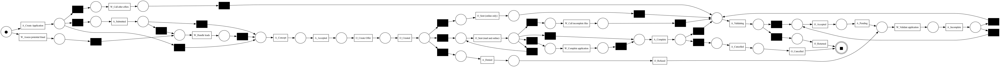

In [30]:
t0 = time.time()
genetic_net, genetic_im, genetic_fm = pm4py.discover_petri_net_genetic(
    discovery_log,
    population_size=200,
    generations=200,
    elitism_rate=0.05,
    crossover_rate=1.0,
    mutation_rate=0.05,
    elitism_min_sample=5,
)
print(f"Runtime: {time.time()-t0:.1f}s")
pm4py.view_petri_net(genetic_net, genetic_im, genetic_fm)

- calculate conformance metrics:

In [31]:
genetic_generalization = pm4py.algo.evaluation.generalization.variants.token_based.apply(event_log, genetic_net, genetic_im, genetic_fm)
genetic_precision = pm4py.algo.evaluation.precision.variants.etconformance_token.apply(event_log, genetic_net, genetic_im, genetic_fm)
genetic_fitness = pm4py.algo.evaluation.replay_fitness.variants.token_replay.apply(event_log, genetic_net, genetic_im, genetic_fm)
print(f"Generalization: {genetic_generalization:.4f}")
print(f"Precision: {genetic_precision:.4f}")
print(f"Fitness: {genetic_fitness}")

replaying log with TBR, completed traces ::   0%|          | 0/5623 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/27816 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/5623 [00:00<?, ?it/s]

Generalization: 0.8624
Precision: 0.7764
Fitness: {'perc_fit_traces': 21.92706845663144, 'average_trace_fitness': 0.9303609533908648, 'log_fitness': 0.9189296848643002, 'percentage_of_fitting_traces': 21.92706845663144}


- calculate simplicity

In [32]:
genetic_node_size = calculate_node_size(genetic_net)
genetic_arc_size = calculate_arc_size(genetic_net)
genetic_cyclicity = calculate_cyclicity(genetic_net)
print(f"Node Size: {genetic_node_size}")
print(f"Arc Size: {genetic_arc_size}")
print(f"Cyclicity: {genetic_cyclicity:.4f}")

Node Size: 85
Arc Size: 96
Cyclicity: 0.2235


- store the petri net in the correct directory

In [ ]:
# Define the target directory and file name for saving the Petri net visualization
target_dir = "../../petrinets/genetic"
file_name = "petri_net_genetic_200g200_p.pdf"
full_path = os.path.join(target_dir, file_name)

# create target directory if it doesn't exist
if not os.path.exists(target_dir):
    os.makedirs(target_dir)

# Save the Petri net visualization to a file
pm4py.save_vis_petri_net(genetic_net, genetic_im, genetic_fm, full_path)

''

- save as loadable model

In [ ]:

target_dir = "../../petrinets/genetic"
if not os.path.exists(target_dir):
    os.makedirs(target_dir)

file_path = os.path.join(target_dir, "genetic_model_200g200_p.pnml")

# Save the Petri net model
pm4py.write_pnml(genetic_net, genetic_im, genetic_fm, file_path)

### Overview relevant metrics

In [35]:

# Initialize the dictionary with lists for both conformance and simplicity metrics
metrics_dict = {
    'Model': [],
    'Fitness (Log)': [],
    'Fitness (Avg Trace)': [],
    'Fitness (% Fit Traces)': [],
    'Precision': [],
    'Generalization': [],
    'Node Size': [],
    'Arc Size': [],
    'Cyclicity': []
}

# Add base models
metrics_dict['Model'].append('Genetic Miner ')

# Add Conformance Metrics 
# (Make sure these variables have been generated in the previous cells)
metrics_dict['Fitness (Log)'].append(genetic_fitness['log_fitness'])
metrics_dict['Fitness (Avg Trace)'].append(genetic_fitness['average_trace_fitness'])
metrics_dict['Fitness (% Fit Traces)'].append(genetic_fitness['perc_fit_traces'])
metrics_dict['Precision'].append(genetic_precision)
metrics_dict['Generalization'].append(genetic_generalization)

# Add Simplicity Metrics
metrics_dict['Node Size'].append(genetic_node_size)
metrics_dict['Arc Size'].append(genetic_arc_size)
metrics_dict['Cyclicity'].append(genetic_cyclicity)

# Create DataFrame
metrics_df = pd.DataFrame(metrics_dict)

# Print the formatted table
print("=" * 135)
print("CONFORMANCE & SIMPLICITY METRICS - GENETIC MINER")
print("=" * 135)
print(metrics_df.to_string(index=False, float_format=lambda x: f"{x:.4f}"))
print("=" * 135)

CONFORMANCE & SIMPLICITY METRICS - GENETIC MINER
         Model  Fitness (Log)  Fitness (Avg Trace)  Fitness (% Fit Traces)  Precision  Generalization  Node Size  Arc Size  Cyclicity
Genetic Miner          0.9189               0.9304                 21.9271     0.7764          0.8624         85        96     0.2235


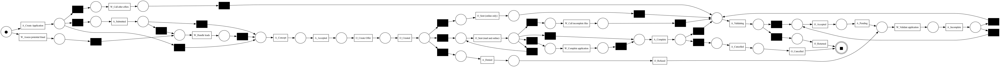

In [36]:
pm4py.view_petri_net(genetic_net, genetic_im, genetic_fm)